In [16]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import cv2
from sklearn.model_selection import train_test_split
from torchinfo import summary

In [2]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

In [3]:
class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

In [4]:
class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()
        
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            # Remove the 1x1 convolution here to avoid channel mismatch
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

In [5]:
class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [6]:
class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=1, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        factor = 2 if bilinear else 1
        
        # Encoder
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024 // factor)
        
        # Decoder
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        
        # Đầu ra
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        # Encoder
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        
        # Decoder
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        
        logits = self.outc(x)
        return torch.sigmoid(logits)


In [19]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Sử dụng device: {device}')
    
    
img_size = (224, 224)
batch_size = 16
num_epochs = 35
learning_rate = 1e-4
val_split = 0.2  
    

    
model = UNet(n_channels=3, n_classes=1).to(device)
print(summary(model, input_size=(batch_size, 3, *img_size)))

Sử dụng device: cuda
Layer (type:depth-idx)                        Output Shape              Param #
UNet                                          [16, 1, 224, 224]         --
├─DoubleConv: 1-1                             [16, 64, 224, 224]        --
│    └─Sequential: 2-1                        [16, 64, 224, 224]        --
│    │    └─Conv2d: 3-1                       [16, 64, 224, 224]        1,792
│    │    └─BatchNorm2d: 3-2                  [16, 64, 224, 224]        128
│    │    └─ReLU: 3-3                         [16, 64, 224, 224]        --
│    │    └─Conv2d: 3-4                       [16, 64, 224, 224]        36,928
│    │    └─BatchNorm2d: 3-5                  [16, 64, 224, 224]        128
│    │    └─ReLU: 3-6                         [16, 64, 224, 224]        --
├─Down: 1-2                                   [16, 128, 112, 112]       --
│    └─Sequential: 2-2                        [16, 128, 112, 112]       --
│    │    └─MaxPool2d: 3-7                    [16, 64, 112, 112] 

In [20]:
def count_parameters(model):
    total_params = 0
    param_details = []
    
    for name, param in model.named_parameters():
        if param.requires_grad:
            params = param.numel()
            total_params += params
            param_details.append((name, params))
            
    return total_params, param_details

total_params, param_details = count_parameters(model)
print("\nModel Architecture:")
print(model)
print("\nModel Parameters:")
for name, params in param_details:
    print(f"{name}: {params:,} parameters")
print(f"Total trainable parameters: {total_params:,}")


Model Architecture:
UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(1

In [7]:
def dice_coef(pred, target, smooth=1.0):
    pred = pred.view(-1)
    target = target.view(-1)
    
    intersection = (pred * target).sum()
    dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)
    
    return dice

In [8]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, pred, target):
        return 1 - dice_coef(pred, target, self.smooth)

class BCEDiceLoss(nn.Module):
    def __init__(self, smooth=1.0, bce_weight=0.5):
        super(BCEDiceLoss, self).__init__()
        self.dice_loss = DiceLoss(smooth)
        self.bce_loss = nn.BCELoss()
        self.bce_weight = bce_weight
        
    def forward(self, pred, target):
        dice_loss = self.dice_loss(pred, target)
        bce_loss = self.bce_loss(pred, target)
        return bce_loss * self.bce_weight + dice_loss * (1 - self.bce_weight)

In [9]:
def load_data(data_path, mask_path, img_size=(224, 224), val_split=0.2):

    images_paths = sorted(glob.glob(os.path.join(data_path, '*.*')))
    masks_paths = sorted(glob.glob(os.path.join(mask_path, '*.*')))
    

    assert len(images_paths) == len(masks_paths), "Số lượng ảnh và mask không khớp nhau!"
    print(f"Tìm thấy {len(images_paths)} cặp ảnh và mask")
    

    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(
        images_paths, masks_paths, test_size=val_split, random_state=42
    )
    
    print(f"Phân chia dữ liệu: {len(train_img_paths)} mẫu huấn luyện, {len(val_img_paths)} mẫu kiểm tra")
    
 
    def process_data(img_paths, mask_paths):
        images = []
        masks = []
        filenames = []
        
        for img_path, mask_path in zip(img_paths, mask_paths):
            filenames.append(os.path.basename(img_path))
            
           
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, img_size)
            image = image / 255.0  
            
           
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, img_size)
            mask = mask / 255.0  
            
            
            image = image.transpose(2, 0, 1)  # [H, W, C] -> [C, H, W]
            mask = np.expand_dims(mask, axis=0)  # [H, W] -> [1, H, W]
            
            images.append(image)
            masks.append(mask)
        
     
        images = np.array(images, dtype=np.float32)
        masks = np.array(masks, dtype=np.float32)
        
        return images, masks, filenames
    
   
    train_images, train_masks, train_filenames = process_data(train_img_paths, train_mask_paths)
    
    val_images, val_masks, val_filenames = process_data(val_img_paths, val_mask_paths)
    
    return train_images, train_masks, val_images, val_masks, train_filenames, val_filenames

In [10]:
def train_model(model, train_data, train_masks, val_data, val_masks, criterion, optimizer, device, batch_size=16, num_epochs=20):
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_dice': [],
        'val_dice': []
    }
    

    train_batches = len(train_data) // batch_size + (1 if len(train_data) % batch_size > 0 else 0)
    val_batches = len(val_data) // batch_size + (1 if len(val_data) % batch_size > 0 else 0)
    
    print(f"Số lượng batch trên tập huấn luyện: {train_batches}")
    print(f"Số lượng batch trên tập kiểm tra: {val_batches}")
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        train_dice = 0
        
        indices = np.random.permutation(len(train_data))
        
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i:i+batch_size]
     
            batch_images = torch.from_numpy(train_data[batch_indices]).float().to(device)
            batch_masks = torch.from_numpy(train_masks[batch_indices]).float().to(device)
            
            optimizer.zero_grad()
            outputs = model(batch_images)
            loss = criterion(outputs, batch_masks)
            
            loss.backward()
            optimizer.step()
            
            batch_loss = loss.item()
            batch_dice = dice_coef(outputs, batch_masks).item()
            
            train_loss += batch_loss
            train_dice += batch_dice
            
            if i % (10 * batch_size) == 0 and i > 0:
                print(f'  Batch {i//batch_size}/{train_batches}: Loss: {batch_loss:.4f}, Dice: {batch_dice:.4f}')
        
        train_loss /= train_batches
        train_dice /= train_batches
        
        model.eval()
        val_loss = 0
        val_dice = 0
        
        with torch.no_grad():
            for i in range(0, len(val_data), batch_size):
                batch_images = torch.from_numpy(val_data[i:i+batch_size]).float().to(device)
                batch_masks = torch.from_numpy(val_masks[i:i+batch_size]).float().to(device)
                
                outputs = model(batch_images)
                loss = criterion(outputs, batch_masks)
                
                batch_dice = dice_coef(outputs, batch_masks).item()
                
                val_loss += loss.item()
                val_dice += batch_dice
        
        val_loss /= val_batches
        val_dice /= val_batches
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_dice'].append(train_dice)
        history['val_dice'].append(val_dice)
        
        print(f'Epoch {epoch+1}/{num_epochs}:')
        print(f'  Train - Loss: {train_loss:.4f}, Dice: {train_dice:.4f}')
        print(f'  Val   - Loss: {val_loss:.4f}, Dice: {val_dice:.4f}')
    
    return history

In [11]:
def plot_training_results(history):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train')
    plt.plot(history['val_loss'], label='Validation')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(history['train_dice'], label='Train')
    plt.plot(history['val_dice'], label='Validation')
    plt.title('Dice Coefficient')
    plt.ylabel('Dice')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('training_results.png')
    plt.show()

In [12]:
def display_predictions(model, val_images, val_masks, val_filenames, device, num_samples=10):
    model.eval()
    
    if num_samples > len(val_images):
        num_samples = len(val_images)
    
    selected_indices = np.random.choice(range(len(val_images)), num_samples, replace=False)
    
    plt.figure(figsize=(15, 5 * num_samples))
    
    results = []
    
    with torch.no_grad():
        for i, idx in enumerate(selected_indices):
            image = torch.from_numpy(val_images[idx:idx+1]).float().to(device)
            mask = val_masks[idx]
            filename = val_filenames[idx]
            
            pred = model(image).cpu().numpy()[0]
            
            pred_binary = (pred > 0.5).astype(np.float32)
            dice = 2 * np.sum(pred_binary * mask) / (np.sum(pred_binary) + np.sum(mask) + 1e-8)
            
            results.append({
                'filename': filename,
                'dice': dice
            })
            
            plt.subplot(num_samples, 3, i*3 + 1)
            plt.imshow(np.transpose(val_images[idx], (1, 2, 0)))
            plt.title(f'Ảnh gốc: {filename}')
            plt.axis('off')
            
            plt.subplot(num_samples, 3, i*3 + 2)
            plt.imshow(mask.squeeze(), cmap='gray')
            plt.title(f'Mask thực tế')
            plt.axis('off')
            
            plt.subplot(num_samples, 3, i*3 + 3)
            plt.imshow(pred.squeeze(), cmap='gray')
            plt.title(f'Dự đoán - Dice: {dice:.4f}')
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('prediction_results.png')
    plt.show()
    
    print("Kết quả dự đoán chi tiết:")
    print("-" * 50)
    print(f"{'File':30} | {'Dice Score':15}")
    print("-" * 50)
    
    avg_dice = 0
    for res in results:
        print(f"{res['filename']:30} | {res['dice']:.4f}{'':10}")
        avg_dice += res['dice']
    
    print("-" * 50)
    print(f"{'Trung bình':30} | {avg_dice/len(results):.4f}{'':10}")
    
    return results

Sử dụng device: cuda
Đang tải và phân chia dữ liệu...
Tìm thấy 200 cặp ảnh và mask
Phân chia dữ liệu: 160 mẫu huấn luyện, 40 mẫu kiểm tra
Đã tải 160 ảnh huấn luyện và 40 ảnh kiểm tra
Bắt đầu huấn luyện...
Số lượng batch trên tập huấn luyện: 10
Số lượng batch trên tập kiểm tra: 3
Epoch 1/35:
  Train - Loss: 0.4850, Dice: 0.5489
  Val   - Loss: 0.6363, Dice: 0.4129
Epoch 2/35:
  Train - Loss: 0.3495, Dice: 0.6614
  Val   - Loss: 0.6227, Dice: 0.3781
Epoch 3/35:
  Train - Loss: 0.3230, Dice: 0.6862
  Val   - Loss: 0.5579, Dice: 0.4207
Epoch 4/35:
  Train - Loss: 0.2888, Dice: 0.7129
  Val   - Loss: 0.3823, Dice: 0.6200
Epoch 5/35:
  Train - Loss: 0.2786, Dice: 0.7220
  Val   - Loss: 0.2781, Dice: 0.7360
Epoch 6/35:
  Train - Loss: 0.2922, Dice: 0.7083
  Val   - Loss: 0.2408, Dice: 0.7659
Epoch 7/35:
  Train - Loss: 0.2670, Dice: 0.7324
  Val   - Loss: 0.2545, Dice: 0.7716
Epoch 8/35:
  Train - Loss: 0.2823, Dice: 0.7198
  Val   - Loss: 0.2313, Dice: 0.7736
Epoch 9/35:
  Train - Loss: 0.25

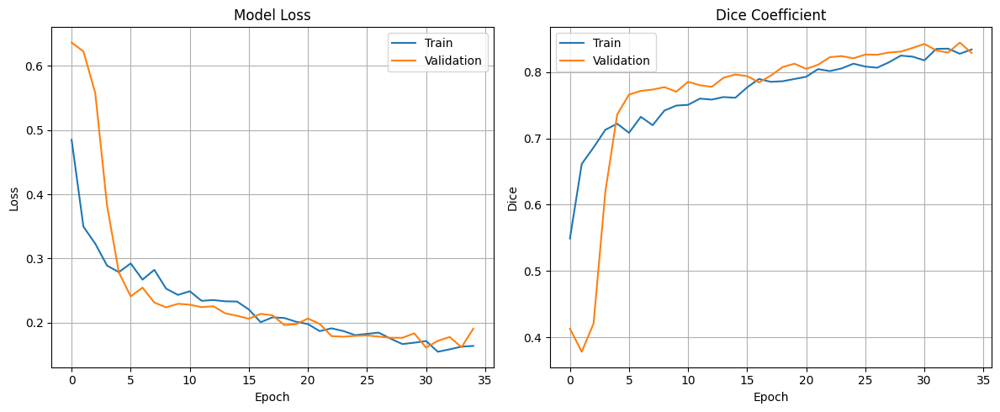


Đánh giá trên 10 mẫu từ tập kiểm tra:


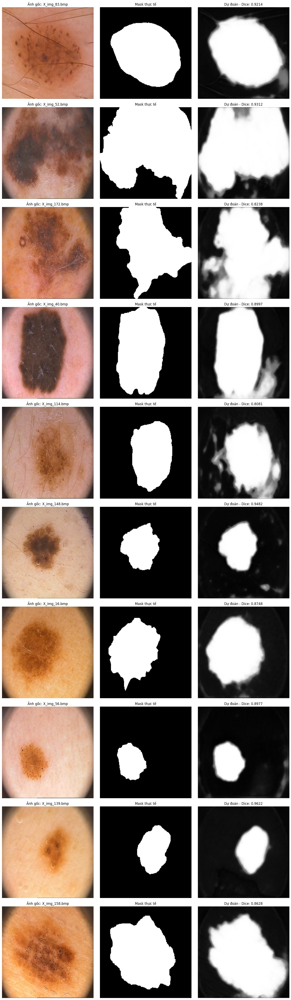

Kết quả dự đoán chi tiết:
--------------------------------------------------
File                           | Dice Score     
--------------------------------------------------
X_img_83.bmp                   | 0.9214          
X_img_52.bmp                   | 0.9312          
X_img_172.bmp                  | 0.8238          
X_img_40.bmp                   | 0.8997          
X_img_114.bmp                  | 0.8081          
X_img_148.bmp                  | 0.9482          
X_img_16.bmp                   | 0.8748          
X_img_56.bmp                   | 0.8977          
X_img_139.bmp                  | 0.9622          
X_img_158.bmp                  | 0.8628          
--------------------------------------------------
Trung bình                     | 0.8930          
Quá trình huấn luyện và đánh giá đã hoàn tất!


In [52]:
def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f'Sử dụng device: {device}')
    
    data_path = "C:/Users/Pc Nguyen Phuc/Downloads/May2025/BT_01/data"
    mask_path = "C:/Users/Pc Nguyen Phuc/Downloads/May2025/BT_01/mask"
    
    img_size = (224, 224)
    batch_size = 16
    num_epochs = 35
    learning_rate = 1e-4
    val_split = 0.2  
    
    print("Đang tải và phân chia dữ liệu...")
    train_images, train_masks, val_images, val_masks, train_filenames, val_filenames = load_data(
        data_path, mask_path, img_size, val_split
    )
    print(f"Đã tải {len(train_images)} ảnh huấn luyện và {len(val_images)} ảnh kiểm tra")
    
    model = UNet(n_channels=3, n_classes=1).to(device)
    
    criterion = BCEDiceLoss(bce_weight=0.5)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    print("Bắt đầu huấn luyện...")
    history = train_model(
        model, train_images, train_masks, val_images, val_masks, 
        criterion, optimizer, device, batch_size, num_epochs
    )
  
    plot_training_results(history)
    
    print("\nĐánh giá trên 10 mẫu từ tập kiểm tra:")
    results = display_predictions(model, val_images, val_masks, val_filenames, device, num_samples=10)
    
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': history,
    }, 'best_unet_model.pth')
    
    print("Quá trình huấn luyện và đánh giá đã hoàn tất!")

if __name__ == "__main__":
    main()

# Cải tiến EfficientNet encoder và data augmentation


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import cv2
from sklearn.model_selection import train_test_split
import torchvision.models as models
import random

In [2]:
def augment_data(image, mask):
    if random.random() > 0.5:
        image = cv2.flip(image, 1)
        mask = cv2.flip(mask, 1)
    
    if random.random() > 0.5:
        image = cv2.flip(image, 0)
        mask = cv2.flip(mask, 0)
    
    if random.random() > 0.5:
        angle = random.uniform(-30, 30)
        h, w = image.shape[:2]
        center = (w // 2, h // 2)
        matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
        image = cv2.warpAffine(image, matrix, (w, h))
        mask = cv2.warpAffine(mask, matrix, (w, h))
    
    return image, mask

In [15]:
class EfficientNetEncoder(nn.Module):
    def __init__(self):
        super(EfficientNetEncoder, self).__init__()
        backbone = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
        self.features = backbone.features
        
    def forward(self, x):
        features = []
        
        x = self.features[0](x)  # Stem: 3->32
        features.append(x)       # Skip connection 0: 32 channels
        
        x = self.features[1](x)  # MBConv, 32->16
        features.append(x)       # Skip connection 1: 16 channels
        
        x = self.features[2](x)  # MBConv, 16->24
        features.append(x)       # Skip connection 2: 24 channels
        
        x = self.features[3](x)  # MBConv, 24->40
        x = self.features[4](x)  # MBConv, 40->40
        features.append(x)       # Skip connection 3: 40 channels
        
        for i in range(5, len(self.features)):
            x = self.features[i](x)
        
        features.append(x)       # Final features: 1280 channels
        
        return features

In [16]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

In [18]:
class EfficientUNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=1):
        super(EfficientUNet, self).__init__()
        
        self.encoder = EfficientNetEncoder()
        
        with torch.no_grad():
            dummy_input = torch.randn(1, 3, 224, 224)
            features = self.encoder(dummy_input)
            
        print("Feature map channels:")
        for i, feat in enumerate(features):
            print(f"Feature {i}: {feat.shape}")
        

        # EfficientNet-B0 typical channels: [32, 16, 24, 40, 80, 112, 192, 320, 1280]
        self.adapt4 = nn.Conv2d(features[-1].shape[1], 512, kernel_size=1)  # Final features -> 512
        self.adapt3 = nn.Conv2d(features[-2].shape[1], 256, kernel_size=1)  # Skip connection 3 -> 256
        self.adapt2 = nn.Conv2d(features[-3].shape[1], 128, kernel_size=1)  # Skip connection 2 -> 128
        self.adapt1 = nn.Conv2d(features[-4].shape[1], 64, kernel_size=1)   # Skip connection 1 -> 64
        self.adapt0 = nn.Conv2d(features[-5].shape[1], 32, kernel_size=1)   # Skip connection 0 -> 32
        
        self.up1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv1 = DoubleConv(256 + 256, 256)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv2 = DoubleConv(128 + 128, 128)
        
        self.up3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv3 = DoubleConv(64 + 64, 64)
        
        self.up4 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.conv4 = DoubleConv(32 + 32, 32)
        
        self.outc = nn.Conv2d(32, n_classes, kernel_size=1)

    def forward(self, x):
        features = self.encoder(x)
        

        f4 = self.adapt4(features[-1])  # Bottleneck
        f3 = self.adapt3(features[-2])  # Skip connection 3
        f2 = self.adapt2(features[-3])  # Skip connection 2
        f1 = self.adapt1(features[-4])  # Skip connection 1
        f0 = self.adapt0(features[-5])  # Skip connection 0
        

        x = self.up1(f4)  # 512 -> 256
        x = F.interpolate(x, size=f3.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f3], dim=1)
        x = self.conv1(x)
        
        x = self.up2(x)  # 256 -> 128
        x = F.interpolate(x, size=f2.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f2], dim=1)
        x = self.conv2(x)
        
        x = self.up3(x)  # 128 -> 64
        x = F.interpolate(x, size=f1.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f1], dim=1)
        x = self.conv3(x)
        
        x = self.up4(x)  # 64 -> 32
        x = F.interpolate(x, size=f0.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f0], dim=1)
        x = self.conv4(x)
        
        x = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)
        
        logits = self.outc(x)
        return torch.sigmoid(logits)

In [7]:
def dice_coef(pred, target, smooth=1.0):
    pred = pred.view(-1)
    target = target.view(-1)
    
    intersection = (pred * target).sum()
    dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)
    
    return dice

In [8]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, pred, target):
        return 1 - dice_coef(pred, target, self.smooth)

class BCEDiceLoss(nn.Module):
    def __init__(self, smooth=1.0, bce_weight=0.5):
        super(BCEDiceLoss, self).__init__()
        self.dice_loss = DiceLoss(smooth)
        self.bce_loss = nn.BCELoss()
        self.bce_weight = bce_weight
        
    def forward(self, pred, target):
        dice_loss = self.dice_loss(pred, target)
        bce_loss = self.bce_loss(pred, target)
        return bce_loss * self.bce_weight + dice_loss * (1 - self.bce_weight)

In [9]:
def load_data(data_path, mask_path, img_size=(224, 224), val_split=0.2):
    images_paths = sorted(glob.glob(os.path.join(data_path, '*.*')))
    masks_paths = sorted(glob.glob(os.path.join(mask_path, '*.*')))
    
    assert len(images_paths) == len(masks_paths), "Số lượng ảnh và mask không khớp nhau!"
    print(f"Tìm thấy {len(images_paths)} cặp ảnh và mask")
    
    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(
        images_paths, masks_paths, test_size=val_split, random_state=42
    )
    
    print(f"Phân chia dữ liệu: {len(train_img_paths)} mẫu huấn luyện, {len(val_img_paths)} mẫu kiểm tra")
    
    def process_data(img_paths, mask_paths, is_training=False):
        images = []
        masks = []
        filenames = []
        
        for img_path, mask_path in zip(img_paths, mask_paths):
            filenames.append(os.path.basename(img_path))
            
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            
            if is_training:
                image, mask = augment_data(image, mask)
            
            image = cv2.resize(image, img_size)
            mask = cv2.resize(mask, img_size)
            
            image = image / 255.0
            mask = mask / 255.0
            
            image = image.transpose(2, 0, 1)  # [H, W, C] -> [C, H, W]
            mask = np.expand_dims(mask, axis=0)  # [H, W] -> [1, H, W]
            
            images.append(image)
            masks.append(mask)
        
        images = np.array(images, dtype=np.float32)
        masks = np.array(masks, dtype=np.float32)
        
        return images, masks, filenames
    
    train_images, train_masks, train_filenames = process_data(train_img_paths, train_mask_paths, is_training=True)
    
    val_images, val_masks, val_filenames = process_data(val_img_paths, val_mask_paths, is_training=False)
    
    return train_images, train_masks, val_images, val_masks, train_filenames, val_filenames

In [10]:
def train_model(model, train_data, train_masks, val_data, val_masks, criterion, optimizer, device, batch_size=16, num_epochs=20):
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_dice': [],
        'val_dice': []
    }
    
    train_batches = len(train_data) // batch_size + (1 if len(train_data) % batch_size > 0 else 0)
    val_batches = len(val_data) // batch_size + (1 if len(val_data) % batch_size > 0 else 0)
    
    print(f"Số lượng batch trên tập huấn luyện: {train_batches}")
    print(f"Số lượng batch trên tập kiểm tra: {val_batches}")
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        train_dice = 0
        
        indices = np.random.permutation(len(train_data))
        
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i:i+batch_size]
            
            batch_images = torch.from_numpy(train_data[batch_indices]).float().to(device)
            batch_masks = torch.from_numpy(train_masks[batch_indices]).float().to(device)
            
            optimizer.zero_grad()
            outputs = model(batch_images)
            loss = criterion(outputs, batch_masks)
            
            loss.backward()
            optimizer.step()
            
            batch_loss = loss.item()
            batch_dice = dice_coef(outputs, batch_masks).item()
            
            train_loss += batch_loss
            train_dice += batch_dice
            
            if i % (10 * batch_size) == 0 and i > 0:
                print(f'  Batch {i//batch_size}/{train_batches}: Loss: {batch_loss:.4f}, Dice: {batch_dice:.4f}')
        
        train_loss /= train_batches
        train_dice /= train_batches
        
        model.eval()
        val_loss = 0
        val_dice = 0
        
        with torch.no_grad():
            for i in range(0, len(val_data), batch_size):
                batch_images = torch.from_numpy(val_data[i:i+batch_size]).float().to(device)
                batch_masks = torch.from_numpy(val_masks[i:i+batch_size]).float().to(device)
                
                outputs = model(batch_images)
                loss = criterion(outputs, batch_masks)
                
                batch_dice = dice_coef(outputs, batch_masks).item()
                
                val_loss += loss.item()
                val_dice += batch_dice
        
        val_loss /= val_batches
        val_dice /= val_batches
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_dice'].append(train_dice)
        history['val_dice'].append(val_dice)
        
        print(f'Epoch {epoch+1}/{num_epochs}:')
        print(f'  Train - Loss: {train_loss:.4f}, Dice: {train_dice:.4f}')
        print(f'  Val   - Loss: {val_loss:.4f}, Dice: {val_dice:.4f}')
    
    return history

In [11]:
def plot_training_results(history):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train')
    plt.plot(history['val_loss'], label='Validation')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(history['train_dice'], label='Train')
    plt.plot(history['val_dice'], label='Validation')
    plt.title('Dice Coefficient')
    plt.ylabel('Dice')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('training_results.png')
    plt.show()

In [13]:
def display_predictions(model, val_images, val_masks, val_filenames, device):
    target_files = [
        "X_img_83.bmp", "X_img_52.bmp", "X_img_172.bmp", "X_img_40.bmp", "X_img_114.bmp",
        "X_img_148.bmp", "X_img_16.bmp", "X_img_56.bmp", "X_img_139.bmp", "X_img_158.bmp"
    ]
    
    model.eval()
    target_set = set(target_files)

    selected_indices = [i for i, fname in enumerate(val_filenames) if fname in target_set]

    plt.figure(figsize=(15, 5 * len(selected_indices)))
    results = []

    with torch.no_grad():
        for i, idx in enumerate(selected_indices):
            image = torch.from_numpy(val_images[idx:idx+1]).float().to(device)
            mask = val_masks[idx]
            filename = val_filenames[idx]

            pred = model(image).cpu().numpy()[0]
            pred_binary = (pred > 0.5).astype(np.float32)
            dice = 2 * np.sum(pred_binary * mask) / (np.sum(pred_binary) + np.sum(mask) + 1e-8)

            results.append({
                'filename': filename,
                'dice': dice
            })

            plt.subplot(len(selected_indices), 3, i*3 + 1)
            plt.imshow(np.transpose(val_images[idx], (1, 2, 0)))
            plt.title(f'Ảnh gốc: {filename}')
            plt.axis('off')

            plt.subplot(len(selected_indices), 3, i*3 + 2)
            plt.imshow(mask.squeeze(), cmap='gray')
            plt.title(f'Mask thực tế')
            plt.axis('off')

            plt.subplot(len(selected_indices), 3, i*3 + 3)
            plt.imshow(pred.squeeze(), cmap='gray')
            plt.title(f'Dự đoán - Dice: {dice:.4f}')
            plt.axis('off')

    plt.tight_layout()
    plt.savefig('prediction_results.png')
    plt.show()

    print("Kết quả dự đoán chi tiết:")
    print("-" * 50)
    print(f"{'File':30} | {'Dice Score':15}")
    print("-" * 50)

    avg_dice = 0
    for res in results:
        print(f"{res['filename']:30} | {res['dice']:.4f}{'':10}")
        avg_dice += res['dice']

    print("-" * 50)
    print(f"{'Trung bình':30} | {avg_dice / len(results):.4f}{'':10}")

    return results

Sử dụng device: cuda
Đang tải và phân chia dữ liệu...
Tìm thấy 200 cặp ảnh và mask
Phân chia dữ liệu: 160 mẫu huấn luyện, 40 mẫu kiểm tra
Đã tải 160 ảnh huấn luyện và 40 ảnh kiểm tra
Khởi tạo mô hình EfficientNet-UNet...
Feature map channels:
Feature 0: torch.Size([1, 32, 112, 112])
Feature 1: torch.Size([1, 16, 112, 112])
Feature 2: torch.Size([1, 24, 56, 56])
Feature 3: torch.Size([1, 80, 14, 14])
Feature 4: torch.Size([1, 1280, 7, 7])
Bắt đầu huấn luyện...
Số lượng batch trên tập huấn luyện: 10
Số lượng batch trên tập kiểm tra: 3
Epoch 1/35:
  Train - Loss: 0.6071, Dice: 0.4245
  Val   - Loss: 0.6306, Dice: 0.4281
Epoch 2/35:
  Train - Loss: 0.5311, Dice: 0.4928
  Val   - Loss: 0.5871, Dice: 0.4704
Epoch 3/35:
  Train - Loss: 0.4668, Dice: 0.5506
  Val   - Loss: 0.4735, Dice: 0.5692
Epoch 4/35:
  Train - Loss: 0.4150, Dice: 0.5911
  Val   - Loss: 0.3749, Dice: 0.6543
Epoch 5/35:
  Train - Loss: 0.3664, Dice: 0.6305
  Val   - Loss: 0.3097, Dice: 0.7042
Epoch 6/35:
  Train - Loss: 0.3

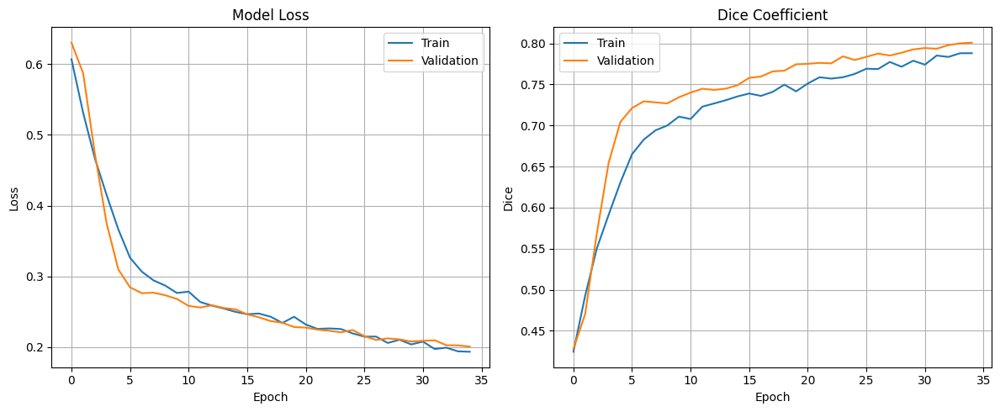


Đánh giá trên 10 mẫu từ tập kiểm tra:


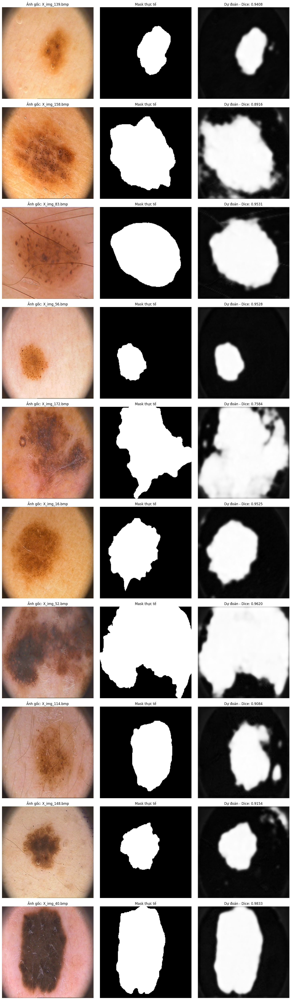

Kết quả dự đoán chi tiết:
--------------------------------------------------
File                           | Dice Score     
--------------------------------------------------
X_img_139.bmp                  | 0.9408          
X_img_158.bmp                  | 0.8916          
X_img_83.bmp                   | 0.9531          
X_img_56.bmp                   | 0.9528          
X_img_172.bmp                  | 0.7584          
X_img_16.bmp                   | 0.9525          
X_img_52.bmp                   | 0.9620          
X_img_114.bmp                  | 0.9084          
X_img_148.bmp                  | 0.9154          
X_img_40.bmp                   | 0.9833          
--------------------------------------------------
Trung bình                     | 0.9218          
Quá trình huấn luyện và đánh giá đã hoàn tất!


In [2]:
def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f'Sử dụng device: {device}')
    
    data_path = "C:/Users/Pc Nguyen Phuc/Downloads/May2025/BT_01/data"
    mask_path = "C:/Users/Pc Nguyen Phuc/Downloads/May2025/BT_01/mask"
    
    img_size = (224, 224)
    batch_size = 16
    num_epochs = 35
    learning_rate = 1e-4
    val_split = 0.2
    
    print("Đang tải và phân chia dữ liệu...")
    train_images, train_masks, val_images, val_masks, train_filenames, val_filenames = load_data(
        data_path, mask_path, img_size, val_split
    )
    print(f"Đã tải {len(train_images)} ảnh huấn luyện và {len(val_images)} ảnh kiểm tra")
    
    print("Khởi tạo mô hình EfficientNet-UNet...")
    model = EfficientUNet(n_channels=3, n_classes=1).to(device)
    
    criterion = BCEDiceLoss(bce_weight=0.5)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    print("Bắt đầu huấn luyện...")
    history = train_model(
        model, train_images, train_masks, val_images, val_masks, 
        criterion, optimizer, device, batch_size, num_epochs
    )
    
    plot_training_results(history)
    
    print("\nĐánh giá trên 10 mẫu từ tập kiểm tra:")
    results = display_predictions(model, val_images, val_masks, val_filenames, device)

    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': history,
    }, 'best_efficient_unet_model.pth')
    
    print("Quá trình huấn luyện và đánh giá đã hoàn tất!")

if __name__ == "__main__":
    main()